# Text-to-Image Generation with Stable Diffusion and CLIP

**Project Overview:**
- Fine-tune Stable Diffusion v1.4 on COCO dataset
- Use CLIP for text encoding and semantic understanding
- Comprehensive evaluation with multiple schedulers and guidance scales
- Calculate FID (Fréchet Inception Distance) and IS (Inception Score) metrics

**Key Components:**
1. Data preprocessing and domain-specific filtering
2. CLIP text embeddings generation
3. Stable Diffusion fine-tuning
4. Scheduler comparison (DPM, PNDM, Euler, DDIM)
5. Evaluation metrics computation
6. Model deployment and custom generation

---
# 1. ENVIRONMENT SETUP
---
Initialize working environment, import required libraries, and verify package versions

In [ ]:

import sys, os
import importlib
import site
import json
import random
from datetime import datetime
from IPython.display import display, Markdown


user_site = os.path.expanduser("~/.local/lib/python3.10/site-packages")
if user_site not in sys.path:
    sys.path.append(user_site)
print(" Core libraries imported")
print(f" Working directory: {os.getcwd()}")

print("All packages installed")
importlib.reload(site)
from PIL import Image     
from tqdm import tqdm      
import numpy as np
import matplotlib.pyplot as plt
try:
    import torch
    import kagglehub
    from transformers import CLIPTokenizer, CLIPTextModel, CLIPProcessor, CLIPModel
    from sklearn.metrics.pairwise import cosine_similarity
    from diffusers import (
        StableDiffusionPipeline,
        DPMSolverMultistepScheduler,
        PNDMScheduler,
        EulerDiscreteScheduler,
        DDIMScheduler
    )
    import diffusers
    import transformers


    print(" PyTorch version:", torch.__version__)
    print(" Diffusers version:", diffusers.__version__)
    print(" Transformers version:", transformers.__version__)
except Exception as e:
    print(" Error importing packages:", e)

 Core libraries imported
 Working directory: /courses/IE7615.202610/students/swamy.ar/Project_2
All packages installed


2025-12-04 11:50:56.915667: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764867056.940313   67746 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764867056.947987   67746 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1764867056.967618   67746 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764867056.967635   67746 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764867056.967638   67746 computation_placer.cc:177] computation placer alr

 PyTorch version: 2.5.1
 Diffusers version: 0.32.2
 Transformers version: 4.49.0


---
# 2. DATASET ACQUISITION
---
Download COCO dataset and configure GPU acceleration

In [ ]:


if torch.cuda.is_available():
    print(" GPU is available:", torch.cuda.get_device_name(0))
    print(f"   CUDA version: {torch.version.cuda}")
    device = "cuda"
else:
    print("GPU not available. Using CPU.")
    device = "cpu"
DEVICE = device
print(f" Device set to: {DEVICE}")




print("\n DOWNLOADING COCO DATASET")
print("=" * 60)

print("Downloading COCO dataset via kagglehub...")
dataset_path = kagglehub.dataset_download("nikhil7280/coco-image-caption")
print(f"Dataset downloaded to: {dataset_path}")

DATASET_ROOT = dataset_path

 GPU is available: Tesla P100-PCIE-12GB
   CUDA version: 12.1
 Device set to: cuda

 DOWNLOADING COCO DATASET
Dataset downloaded to: /home/swamy.ar/.cache/kagglehub/datasets/nikhil7280/coco-image-caption/versions/1


In [ ]:

print("\nEXPLORING DATASET STRUCTURE")
print("=" * 60)

for root, dirs, files in os.walk(DATASET_ROOT):
    level = root.replace(DATASET_ROOT, '').count(os.sep)
    if level > 2:  
        continue
    indent = ' ' * 2 * level
    print(f"{indent} {os.path.basename(root)}/")
    subindent = ' ' * 2 * (level + 1)

    for d in dirs[:3]:
        print(f"{subindent} {d}/")

    for f in files[:3]:
        print(f"{subindent} {f}")


EXPLORING DATASET STRUCTURE
 1/
   annotations_trainval2014/
   annotations_trainval2017/
   train2014/
   annotations_trainval2014/
     annotations/
     annotations/
       captions_train2014.json
       captions_val2014.json
       instances_train2014.json
   annotations_trainval2017/
     annotations/
     annotations/
       captions_train2017.json
       captions_val2017.json
       instances_train2017.json
   train2014/
     train2014/
     train2014/
       COCO_train2014_000000000009.jpg
       COCO_train2014_000000000025.jpg
       COCO_train2014_000000000030.jpg
   val2017/
     val2017/
     val2017/
       000000000139.jpg
       000000000285.jpg
       000000000632.jpg


In [ ]:


print("\n LOCATING DATASET COMPONENTS")
print("=" * 60)

caption_file = None
img_dir = None


for root, dirs, files in os.walk(DATASET_ROOT):
    for file in files:
        if "captions_train2014.json" in file:
            caption_file = os.path.join(root, file)
            break
    if caption_file:
        break

for root, dirs, files in os.walk(DATASET_ROOT):
    if "train2014" in dirs:
        potential_dir = os.path.join(root, "train2014")
        if os.path.exists(potential_dir):
            sample_files = os.listdir(potential_dir)[:10]
            if any(f.endswith(('.jpg', '.png', '.JPEG')) for f in sample_files):
                img_dir = potential_dir
                break

print(f" Captions file: {caption_file}")
print(f" Images directory: {img_dir}")

if not caption_file or not img_dir:
    print(" ERROR: Dataset components not found!")
else:
    print(f" Dataset ready for processing")


 LOCATING DATASET COMPONENTS
 Captions file: /home/swamy.ar/.cache/kagglehub/datasets/nikhil7280/coco-image-caption/versions/1/annotations_trainval2014/annotations/captions_train2014.json
 Images directory: /home/swamy.ar/.cache/kagglehub/datasets/nikhil7280/coco-image-caption/versions/1/train2014/train2014
 Dataset ready for processing


---
# 3. DATA PREPROCESSING
---
Load captions, select domain-specific subset, and preprocess images

In [ ]:


print("\n LOADING CAPTION-IMAGE PAIRS")
print("=" * 60)


with open(caption_file, "r") as f:
    captions_data = json.load(f)

id_to_filename = {img["id"]: img["file_name"] for img in captions_data["images"]}


pairs = []
for ann in captions_data["annotations"]:
    image_id = ann["image_id"]
    if image_id in id_to_filename:
        pairs.append({
            "image_path": os.path.join(img_dir, id_to_filename[image_id]),
            "caption": ann["caption"]
        })

print(f" Loaded {len(pairs)} image-caption pairs")
print(f" Example: {pairs[0]['caption'][:100]}...")


 LOADING CAPTION-IMAGE PAIRS
 Loaded 414113 image-caption pairs
 Example: A very clean and well decorated empty bathroom...


## 3.1 Domain-Specific Filtering
CHOOSING SUBSET OF IMAGES

In [ ]:

print("\n DOMAIN SELECTION FOR FOCUSED TRAINING")
print("=" * 60)


DOMAINS = {
    "1": {"name": "animals", "keywords": ["dog", "cat", "bird", "horse", "elephant", "bear", "zebra", "animal"]},
    "2": {"name": "vehicles", "keywords": ["car", "truck", "bus", "train", "airplane", "boat", "motorcycle", "vehicle"]},
    "3": {"name": "food", "keywords": ["pizza", "donut", "cake", "sandwich", "apple", "banana", "food", "eating"]},
    "4": {"name": "sports", "keywords": ["ball", "tennis", "soccer", "basketball", "skateboard", "sport", "playing"]},
    "5": {"name": "indoor", "keywords": ["couch", "bed", "table", "chair", "tv", "laptop", "room", "kitchen"]}
}

print("Available domains:")
for key, domain in DOMAINS.items():
    print(f"  [{key}] {domain['name'].upper()}")


choice = input("\n Enter domain number (1-5) or 'all' for general: ").strip()

if choice.lower() == 'all':
    print("\n CREATING GENERAL SUBSET FOR PROCESSING")
    print("=" * 60)
    SUBSET_SIZE = 4000
    random.seed(42)
    subset = random.sample(pairs, min(SUBSET_SIZE, len(pairs)))
else:

    domain_keywords = DOMAINS[choice]["keywords"]
    domain_name = DOMAINS[choice]["name"]

    print(f"\n FILTERING FOR {domain_name.upper()} DOMAIN")
    print("=" * 60)


    domain_pairs = []
    for pair in pairs:
        caption_lower = pair["caption"].lower()
        if any(keyword in caption_lower for keyword in domain_keywords):
            domain_pairs.append(pair)

    print(f"Found {len(domain_pairs)} {domain_name} images in dataset")


    SUBSET_SIZE = min(4000, len(domain_pairs))
    random.seed(42)
    subset = random.sample(domain_pairs, SUBSET_SIZE)

    print(f"Selected {len(subset)} {domain_name} samples for processing")


os.makedirs("data/processed", exist_ok=True)
os.makedirs("data/processed/images", exist_ok=True)
os.makedirs("data/processed/embeddings", exist_ok=True)
os.makedirs("data/generated_samples", exist_ok=True)
print(f" Created directory structure")


 DOMAIN SELECTION FOR FOCUSED TRAINING
Available domains:
  [1] ANIMALS
  [2] VEHICLES
  [3] FOOD
  [4] SPORTS
  [5] INDOOR



 Enter domain number (1-5) or 'all' for general:  1



 FILTERING FOR ANIMALS DOMAIN
Found 69125 animals images in dataset
Selected 4000 animals samples for processing
 Created directory structure


In [ ]:


print("\n PROCESSING AND RESIZING IMAGES")
print("=" * 60)

import shutil
from PIL import Image

processed_dir = "data/processed/images"
if os.path.exists(processed_dir) and len(os.listdir(processed_dir)) > 0:
    print(f" Clearing existing processed images...")
    shutil.rmtree(processed_dir)
    os.makedirs(processed_dir)

saved_count = 0
subset_clean = []

for item in tqdm(subset, desc="Processing images"):
    img_path = item["image_path"]
    if not os.path.exists(img_path):
        continue

    try:
        img = Image.open(img_path).convert("RGB")
        img = img.resize((256, 256))
        save_path = os.path.join(processed_dir, os.path.basename(img_path))
        img.save(save_path)


        new_item = item.copy()
        new_item["image_path"] = save_path
        subset_clean.append(new_item)
        saved_count += 1
    except Exception as e:
        continue

print(f" Processed {saved_count} images → {processed_dir}")


 PROCESSING AND RESIZING IMAGES
 Clearing existing processed images...


Processing images: 100%|██████████| 4000/4000 [01:36<00:00, 41.28it/s]

 Processed 4000 images → data/processed/images


In [ ]:


print("\n SAVING METADATA")
print("=" * 60)

captions_json = "data/processed/captions_subset.json"
with open(captions_json, "w") as f:
    json.dump(subset_clean, f, indent=2)

print(f" Metadata saved: {captions_json}")
print(f" Final dataset: {len(subset_clean)} pairs")


 SAVING METADATA
 Metadata saved: data/processed/captions_subset.json
 Final dataset: 4000 pairs


---
# 4. CLIP TEXT ENCODING
---
Generate semantic text embeddings using CLIP (Contrastive Language-Image Pre-training)

In [ ]:


print("\n LOADING CLIP MODEL")
print("=" * 60)

model_name = "openai/clip-vit-base-patch32"
print(f" Loading: {model_name}")


tokenizer = CLIPTokenizer.from_pretrained(model_name)
text_model = CLIPTextModel.from_pretrained(model_name).to(DEVICE)
text_model.eval() 

print(f" CLIP model loaded on {DEVICE}")
print(f" Parameters: {sum(p.numel() for p in text_model.parameters())/1e6:.2f}M")


 LOADING CLIP MODEL
 Loading: openai/clip-vit-base-patch32
 CLIP model loaded on cuda
 Parameters: 63.17M


## 4.1 Generate Text Embeddings
Convert captions to dense vector representations

In [ ]:


print("\n GENERATING TEXT EMBEDDINGS")
print("=" * 60)

def encode_text_batch(texts, max_length=77):
    """Encode text to embeddings using CLIP"""
    inputs = tokenizer(
        texts,
        padding="max_length",
        truncation=True,
        max_length=max_length,
        return_tensors="pt"
    ).to(DEVICE)

    with torch.no_grad():
        outputs = text_model(**inputs)
        hidden = outputs.last_hidden_state
        mask = inputs["attention_mask"].unsqueeze(-1)
        pooled = (hidden * mask).sum(dim=1) / mask.sum(dim=1).clamp(min=1e-9)

    return pooled.cpu().numpy()


with open(captions_json, "r") as f:
    caption_data = json.load(f)

# Generate embeddings in batches
BATCH_SIZE = 64
all_embeddings = []
metadata = []

for i in tqdm(range(0, len(caption_data), BATCH_SIZE), desc="Encoding batches"):
    batch = caption_data[i:i+BATCH_SIZE]
    texts = [x["caption"] for x in batch]
    embeddings_batch = encode_text_batch(texts)
    all_embeddings.append(embeddings_batch)

    for j, item in enumerate(batch):
        metadata.append({
            "idx": i+j,
            "image_path": item["image_path"],
            "caption": item["caption"]
        })

# Concatenate all batches
embeddings = np.vstack(all_embeddings)
emb_dir = "data/processed/embeddings"

np.save(os.path.join(emb_dir, "text_embeddings.npy"), embeddings)
with open(os.path.join(emb_dir, "text_index.json"), "w") as f:
    json.dump(metadata, f, indent=2)

print(f" Embeddings shape: {embeddings.shape}")
print(f" Saved to {emb_dir}")



 GENERATING TEXT EMBEDDINGS


Encoding batches: 100%|██████████| 63/63 [00:07<00:00,  8.52it/s]

 Embeddings shape: (4000, 512)
 Saved to data/processed/embeddings


In [ ]:

print("\n VERIFYING EMBEDDINGS")
print("=" * 60)
from sklearn.metrics.pairwise import cosine_similarity

sample_sims = cosine_similarity(embeddings[0:1], embeddings[1:6])[0]
print("Cosine similarities (caption 0 vs next 5):")
for i, sim in enumerate(sample_sims, 1):
    print(f"  Caption {i}: {sim:.4f}")

env_info = {
    "model": model_name,
    "num_samples": len(caption_data),
    "embedding_shape": list(embeddings.shape),
    "device": DEVICE,
    "timestamp": datetime.now().isoformat()
}

with open(os.path.join(emb_dir, "env_info.json"), "w") as f:
    json.dump(env_info, f, indent=2)

print(f" Embeddings verified and environment saved")



 VERIFYING EMBEDDINGS
Cosine similarities (caption 0 vs next 5):
  Caption 1: 0.5427
  Caption 2: 0.4731
  Caption 3: 0.7114
  Caption 4: 0.4945
  Caption 5: 0.5107
 Embeddings verified and environment saved


---
# 5. STABLE DIFFUSION PIPELINE
---
Load pre-trained Stable Diffusion model and generate initial samples


 LOADING STABLE DIFFUSION
 Loading: CompVis/stable-diffusion-v1-4


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

 Pipeline loaded on cuda
 Memory optimization: Enabled

 GENERATING TEST IMAGES - MILESTONE 1

 Prompt 1/5: "A golden retriever playing fetch on a sunny beach..."
   Generating...

  0%|          | 0/25 [00:00<?, ?it/s]

  Done! (8.9s)

 Prompt 2/5: "A cozy coffee shop interior with warm lighting..."
   Generating...

  0%|          | 0/25 [00:00<?, ?it/s]

  Done! (8.7s)

 Prompt 3/5: "A futuristic city skyline at night with neon light..."
   Generating...

  0%|          | 0/25 [00:00<?, ?it/s]

  Done! (8.7s)

 Prompt 4/5: "A serene mountain landscape with lake reflection..."
   Generating...

  0%|          | 0/25 [00:00<?, ?it/s]

  Done! (8.7s)

 Prompt 5/5: "Fresh sushi on a wooden plate with chopsticks..."
   Generating...

  0%|          | 0/25 [00:00<?, ?it/s]

  Done! (8.7s)

 Generated 5 test images


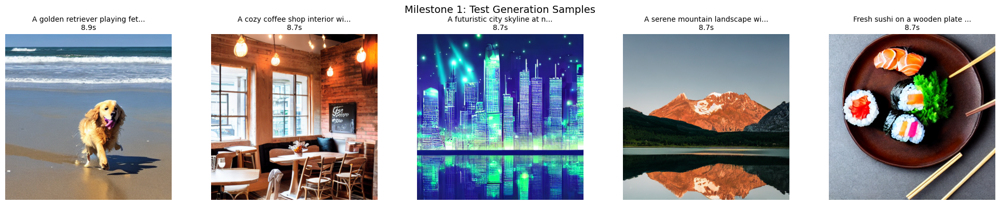

In [ ]:



print("\n LOADING STABLE DIFFUSION")
print("=" * 60)

model_id = "CompVis/stable-diffusion-v1-4"
print(f" Loading: {model_id}")


pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if DEVICE == "cuda" else torch.float32,
    safety_checker=None,
    requires_safety_checker=False
)
pipe = pipe.to(DEVICE)
pipe.enable_attention_slicing()  

print(f" Pipeline loaded on {DEVICE}")
print(f" Memory optimization: Enabled")

print("\n GENERATING TEST IMAGES - MILESTONE 1")
print("=" * 60)

output_dir = "data/generated_samples"

test_prompts = [
    "A golden retriever playing fetch on a sunny beach",
    "A cozy coffee shop interior with warm lighting",
    "A futuristic city skyline at night with neon lights",
    "A serene mountain landscape with lake reflection",
    "Fresh sushi on a wooden plate with chopsticks"
]

generated_images = []
generation_metadata = []

for idx, prompt in enumerate(test_prompts):
    print(f"\n Prompt {idx+1}/5: \"{prompt[:50]}...\"")
    print("   Generating...", end="")

    start_time = datetime.now()

    with torch.inference_mode():
        result = pipe(
            prompt=prompt,
            num_inference_steps=25,
            guidance_scale=7.5,
            height=512,
            width=512
        )

    gen_time = (datetime.now() - start_time).total_seconds()
    image = result.images[0]

    # Save image
    filename = f"test_{idx+1}_{datetime.now().strftime('%H%M%S')}.png"
    filepath = os.path.join(output_dir, filename)
    image.save(filepath)

    generated_images.append(image)
    generation_metadata.append({
        "prompt": prompt,
        "filepath": filepath,
        "generation_time": gen_time
    })

    print(f"  Done! ({gen_time:.1f}s)")

print(f"\n Generated {len(generated_images)} test images")
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for idx, (img, meta) in enumerate(zip(generated_images, generation_metadata)):
    axes[idx].imshow(img)
    axes[idx].set_title(f"{meta['prompt'][:30]}...\n{meta['generation_time']:.1f}s", fontsize=10)
    axes[idx].axis('off')
plt.suptitle("Milestone 1: Test Generation Samples", fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:

print("\n CLIP + DIFFUSION INTEGRATION")
print("=" * 60)


print("1. Verifying CLIP is integrated in Stable Diffusion:")
print(f"   Text Encoder Model: {pipe.text_encoder.config._name_or_path}")
print(f"   Model Type: {pipe.text_encoder.config.model_type}")
print(f"    Confirmed: Using CLIP text encoder\n")


print("2. CLIP → UNet Integration Flow:")
sample_caption = subset_clean[0]["caption"] if 'subset_clean' in locals() else "A dog playing in the park"
print(f"   Sample text: '{sample_caption}'\n")



print("   Step 1: CLIP encodes text to embeddings")
text_inputs = pipe.tokenizer(
    sample_caption,
    max_length=77,
    return_tensors="pt",
    padding="max_length",
    truncation=True
).to(DEVICE)


with torch.no_grad():
    clip_embeddings = pipe.text_encoder(text_inputs.input_ids)[0]
print(f"   → CLIP output shape: {clip_embeddings.shape}")
print(f"     (batch=1, seq_len=77, embed_dim=768)\n")


print("   Step 2: CLIP embeddings feed into UNet cross-attention layers")
cross_attention_layers = [name for name, _ in pipe.unet.named_modules() if "attn2" in name and "to_v" in name]
print(f"   → Found {len(cross_attention_layers)} cross-attention layers")
print(f"   → Example layers: {cross_attention_layers[:3]}\n")


print("   Step 3: Running integrated pipeline")
with torch.no_grad():

    latent_dtype = pipe.unet.dtype
    latent = torch.randn(
        1,
        pipe.unet.config.in_channels,
        64,
        64,
        device=DEVICE,
        dtype=latent_dtype  
    )
    timestep = torch.tensor([999], device=DEVICE, dtype=torch.long)


    clip_embeddings = clip_embeddings.to(dtype=latent_dtype)


    noise_pred = pipe.unet(
        latent,
        timestep,
        encoder_hidden_states=clip_embeddings
    ).sample

    print(f"   → UNet processes latent WITH CLIP conditioning")
    print(f"   → Output shape: {noise_pred.shape}")

print("\n CLIP-Diffusion Integration Verified!")
print("   The text_encoder (CLIP) embeddings directly condition the UNet")
print("   through cross-attention layers during the denoising process.\n")


print("3. Testing integrated pipeline with actual generation:")
test_image = pipe(
    sample_caption,
    num_inference_steps=20,
    guidance_scale=7.5
).images[0]
print("    Successfully generated image using CLIP-conditioned diffusion!")

print("=" * 60)


 CLIP + DIFFUSION INTEGRATION
1. Verifying CLIP is integrated in Stable Diffusion:
   Text Encoder Model: /home/swamy.ar/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/text_encoder
   Model Type: clip_text_model
    Confirmed: Using CLIP text encoder

2. CLIP → UNet Integration Flow:
   Sample text: 'A dog in a yard looking through a fence.'

   Step 1: CLIP encodes text to embeddings
   → CLIP output shape: torch.Size([1, 77, 768])
     (batch=1, seq_len=77, embed_dim=768)

   Step 2: CLIP embeddings feed into UNet cross-attention layers
   → Found 16 cross-attention layers
   → Example layers: ['down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_v', 'down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_v', 'down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v']

   Step 3: Running integrated pipeline
   → UNet processes latent WITH CLIP conditioning
   → Output shape: torch.Size([1, 4, 64, 64])

 CLIP-

  0%|          | 0/20 [00:00<?, ?it/s]

    Successfully generated image using CLIP-conditioned diffusion!



 GENERATE IMAGE with Stable diffusion model


Enter your prompt:  highly detailed tiger image



📸 Generating: highly detailed tiger image
   Please wait...


  0%|          | 0/25 [00:00<?, ?it/s]

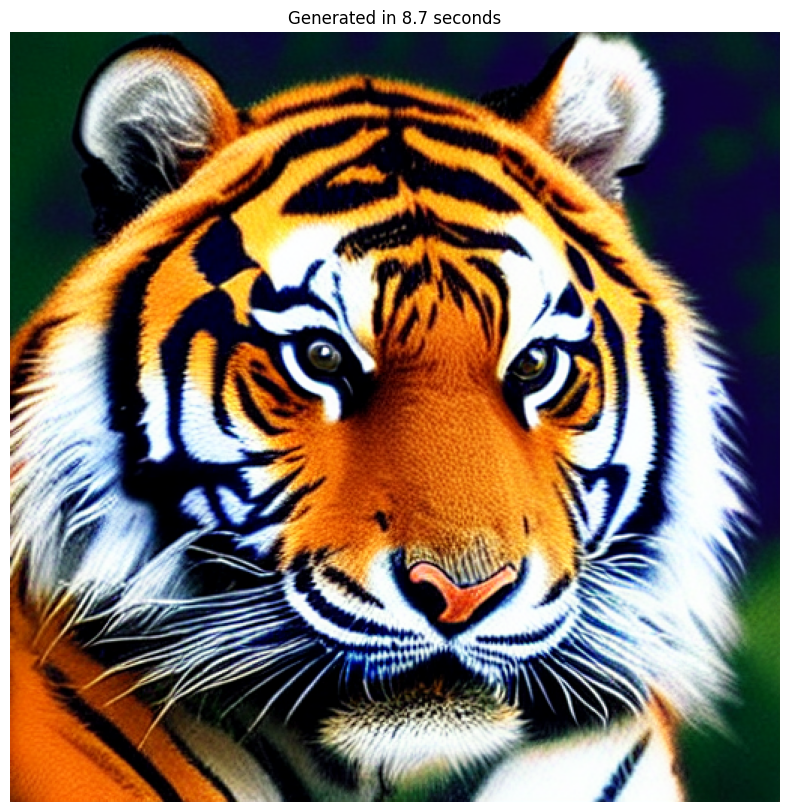

Run this cell again to generate another image.


In [ ]:

print("\n GENERATE IMAGE with Stable diffusion model")
print("=" * 60)


user_prompt = input("Enter your prompt: ")

if user_prompt.strip():
    print(f"\n📸 Generating: {user_prompt}")
    print("   Please wait...")

    start_time = datetime.now()


    with torch.inference_mode():
        result = pipe(
            prompt=user_prompt,
            num_inference_steps=25,
            guidance_scale=7.5,
            height=512,
            width=512
        )

    gen_time = (datetime.now() - start_time).total_seconds()

    plt.figure(figsize=(10, 10))
    plt.imshow(result.images[0])
    plt.title(f"Generated in {gen_time:.1f} seconds", fontsize=12)
    plt.axis('off')
    plt.show()

    print(f"Run this cell again to generate another image.")
else:
    print(" No prompt entered. Please run the cell again.")

---
# 6. MODEL FINE-TUNING
---
Fine-tune Stable Diffusion UNet on domain-specific data

In [ ]:

print("\n CLEARING ALL UNNECESSARY MEMORY")
print("=" * 60)

import torch
import gc
import os



vars_to_delete = ['text_model', 'model', 'embeddings', 'generated_images',
                  'all_embeddings', 'metadata', 'pairs', 'caption_data']

for var in vars_to_delete:
    if var in globals():
        del globals()[var]
        print(f"   Deleted {var}")

torch.cuda.empty_cache()
gc.collect()

print(f"  GPU Memory: {torch.cuda.memory_allocated()/1024**3:.2f} GB")

print("=" * 60)


if pipe.unet.dtype != torch.float16:

 
    pipe.unet = pipe.unet.half()   
    pipe.vae = pipe.vae.half()     
    pipe.text_encoder = pipe.text_encoder.half()  

unet = pipe.unet
vae = pipe.vae
text_encoder = pipe.text_encoder
tokenizer = pipe.tokenizer
trainable_params = []
param_names = []



for name, param in unet.named_parameters():

    if "attn2" in name and "to_v" in name:
        param.requires_grad = True
        trainable_params.append(param)
        param_names.append(name)
    else:
        param.requires_grad = False


print(f"   Training only {len(trainable_params)} parameters")
print(f"   Total trainable: {sum(p.numel() for p in trainable_params)/1e6:.2f}M")
print(f"   Frozen: {sum(p.numel() for p in unet.parameters() if not p.requires_grad)/1e6:.2f}M")


print("\n  Training layers:")
for name in param_names[:5]:
    print(f"    - {name}")
if len(param_names) > 5:
    print(f"    ... and {len(param_names)-5} more")


unet.train()
vae.eval()
text_encoder.eval()


unet.enable_gradient_checkpointing()



print("\n CREATING OPTIMIZER")
print("=" * 60)

import torch.optim as optim
from diffusers import DDPMScheduler
import torch.nn.functional as F


optimizer = optim.SGD(
    trainable_params,
    lr=1e-5,
    momentum=0.9
)

print(f"   Using SGD optimizer (memory efficient)")
print(f"   Optimizing {len(trainable_params)} parameters only")

noise_scheduler = DDPMScheduler.from_config(pipe.scheduler.config)

torch.cuda.empty_cache()
print(f"  GPU Memory: {torch.cuda.memory_allocated()/1024**3:.2f} GB")


print("\n CREATING ANIMAL DATASET")
print("=" * 60)

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import random

class AnimalDataset(Dataset):
    def __init__(self, pairs, tokenizer, size=256, max_samples=2000):

        random.seed(42)
        self.pairs = random.sample(pairs, min(max_samples, len(pairs)))
        self.tokenizer = tokenizer

   
        self.transforms = transforms.Compose([
            transforms.Resize((size, size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5])
        ])

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        pair = self.pairs[idx]
        image = Image.open(pair["image_path"]).convert("RGB")
        image = self.transforms(image)

     
        text_inputs = self.tokenizer(
            pair["caption"],
            max_length=77,
            padding="max_length",
            truncation=True,
            return_tensors="pt"
        )

        return {
            "pixel_values": image,
            "input_ids": text_inputs.input_ids[0]
        }


train_dataset = AnimalDataset(subset_clean, tokenizer, 256, max_samples=2000)
train_dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True)

print(f"  Training on {len(train_dataset)} animal images (50% of our 4000)")
print(f"  This gives us excellent coverage of the animal domain!")



print("\n STARTING TRAINING ON ANIMAL DATASET")
print("=" * 60)
print("  Training the  attention layers to save memory")
print("  Using a large portion of our animal dataset!")

import numpy as np
from datetime import datetime

losses = []


NUM_EPOCHS = 2
MAX_STEPS = len(train_dataset) * NUM_EPOCHS
CHECKPOINT_EVERY = 100

print(f"  Will train for {NUM_EPOCHS} epochs")
print(f"  Total steps: {MAX_STEPS} (seeing each image {NUM_EPOCHS} times)")
print(f"  This uses ALL {len(train_dataset)} images multiple times!\n")

start_time = datetime.now()
global_step = 0

for epoch in range(NUM_EPOCHS):
    print(f"\n EPOCH {epoch + 1}/{NUM_EPOCHS}")
    print("-" * 40)

    epoch_losses = []

    for step, batch in enumerate(train_dataloader):
        if global_step >= MAX_STEPS:
            break


        if global_step % 10 == 0:
            torch.cuda.empty_cache()


        pixel_values = batch["pixel_values"].to(DEVICE, dtype=torch.float16)
        input_ids = batch["input_ids"].to(DEVICE)

        try:

            # FORWARD PASS
            with torch.no_grad():

                # Encode image to latent space
                latents = vae.encode(pixel_values).latent_dist.sample()
                latents = latents * vae.config.scaling_factor
                encoder_hidden_states = text_encoder(input_ids)[0]


            with torch.amp.autocast('cuda', dtype=torch.float16):
                noise = torch.randn_like(latents)
                timesteps = torch.randint(0, 1000, (1,), device=DEVICE).long()
                noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)


                noise_pred = unet(
                    noisy_latents,
                    timesteps,
                    encoder_hidden_states=encoder_hidden_states
                ).sample


                loss = F.mse_loss(noise_pred.float(), noise.float())


            if torch.isnan(loss):
                print(f"  Step {global_step}: NaN - skipping")
                optimizer.zero_grad()
                continue

            # BACKWARD PASS & OPTIMIZATION
            loss.backward()
            torch.nn.utils.clip_grad_norm_(trainable_params, max_norm=1.0)
            optimizer.step()
            optimizer.zero_grad()

            losses.append(loss.item())
            epoch_losses.append(loss.item())


            if global_step % 50 == 0:
                mem = torch.cuda.memory_allocated()/1024**3
                elapsed = (datetime.now() - start_time).total_seconds()
                imgs_per_sec = (global_step + 1) / elapsed if elapsed > 0 else 0
                print(f"  Step {global_step:4d}: Loss = {loss.item():.4f} | Mem = {mem:.1f} GB | {imgs_per_sec:.1f} imgs/sec")


            if global_step % CHECKPOINT_EVERY == 0 and global_step > 0:
                avg_loss = np.mean(losses[-100:]) if len(losses) >= 100 else np.mean(losses)
                print(f"   Checkpoint: Avg loss = {avg_loss:.4f} | Processed {global_step}/{MAX_STEPS} steps")

            global_step += 1

        except RuntimeError as e:
            if "out of memory" in str(e):
                print(f"  Step {global_step}: OOM - clearing cache")
                optimizer.zero_grad()
                torch.cuda.empty_cache()
                continue
            else:
                raise e


    if epoch_losses:
        epoch_avg = np.mean(epoch_losses)
        print(f"\n   Epoch {epoch+1} complete: Avg loss = {epoch_avg:.4f}")

elapsed_total = (datetime.now() - start_time).total_seconds()
print(f"\n Training complete!")
print(f"  Total steps: {global_step}")
print(f"  Images seen: {global_step} (each image seen {NUM_EPOCHS} times)")
print(f"  Time: {elapsed_total:.1f} seconds ({elapsed_total/60:.1f} minutes)")
print(f"  Avg loss: {np.mean(losses):.4f}" if losses else "N/A")


print("\n CLEANUP")
print("=" * 60)


for param in unet.parameters():
    param.requires_grad = True

unet.eval()
del optimizer
torch.cuda.empty_cache()
gc.collect()

print(f"  Final GPU Memory: {torch.cuda.memory_allocated()/1024**3:.2f} GB")




 CLEARING ALL UNNECESSARY MEMORY
   Deleted text_model
   Deleted embeddings
   Deleted generated_images
   Deleted all_embeddings
   Deleted metadata
   Deleted pairs
   Deleted caption_data
  GPU Memory: 2.02 GB
   Training only 16 parameters
   Total trainable: 9.58M
   Frozen: 849.94M

  Training layers:
    - down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_v.weight
    - down_blocks.0.attentions.1.transformer_blocks.0.attn2.to_v.weight
    - down_blocks.1.attentions.0.transformer_blocks.0.attn2.to_v.weight
    - down_blocks.1.attentions.1.transformer_blocks.0.attn2.to_v.weight
    - down_blocks.2.attentions.0.transformer_blocks.0.attn2.to_v.weight
    ... and 11 more

 CREATING OPTIMIZER
   Using SGD optimizer (memory efficient)
   Optimizing 16 parameters only
  GPU Memory: 2.02 GB

 CREATING ANIMAL DATASET
  Training on 2000 animal images (50% of our 4000)
  This gives us excellent coverage of the animal domain!

 STARTING TRAINING ON ANIMAL DATASET
  Training the  att

In [ ]:


print("\n SAVING FINE-TUNED MODEL")
print("=" * 60)

model_save_path = "models/fine_tuned_animals"
os.makedirs(model_save_path, exist_ok=True)

print("  Saving fine-tuned pipeline...")
try:

    pipe.save_pretrained(model_save_path)
    print(f"   Complete pipeline saved to: {model_save_path}")


    unet_path = os.path.join(model_save_path, "unet_finetuned")
    pipe.unet.save_pretrained(unet_path)
    print(f"   Fine-tuned UNet saved to: {unet_path}")

 
    training_info = {
        "domain": "animals",
        "training_samples": len(train_dataset),
        "total_steps": global_step,
        "epochs": NUM_EPOCHS,
        "final_loss": float(np.mean(losses[-10:])) if losses else None,
        "training_time_seconds": elapsed_total,
        "date": datetime.now().isoformat()
    }

    import json
    with open(os.path.join(model_save_path, "training_info.json"), "w") as f:
        json.dump(training_info, f, indent=2)
    print(f"   Training info saved")

except Exception as e:
    print(f"   Error saving model: {e}")
    print("  WARNING: Model not saved")

print("=" * 60)


 SAVING FINE-TUNED MODEL
  Saving fine-tuned pipeline...
   Complete pipeline saved to: models/fine_tuned_animals
   Fine-tuned UNet saved to: models/fine_tuned_animals/unet_finetuned
   Training info saved



 GENERATING IMAGES WITH FINE-TUNED MODEL
  Generating: A majestic lion in the savanna


  0%|          | 0/20 [00:00<?, ?it/s]

     Saved as animal_1.png
  Generating: A playful puppy in a garden


  0%|          | 0/20 [00:00<?, ?it/s]

     Saved as animal_2.png
  Generating: A colorful parrot on a tree branch


  0%|          | 0/20 [00:00<?, ?it/s]

     Saved as animal_3.png

   Generated 3 test images


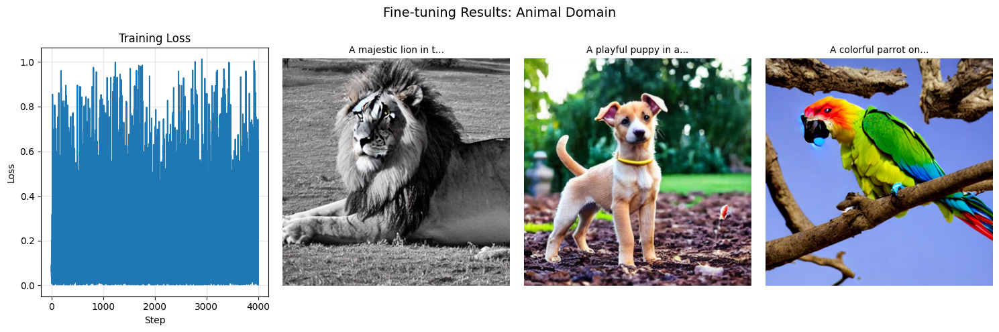


 ANIMAL FINE-TUNING COMPLETE!
  • Trained on 2000 of our 4000 animal images
  • Only trained attention layers (memory efficient)
  • Model is now better at understanding animal-related prompts

 For even better results, consider:
  • Training for more steps (increase MAX_STEPS)
  • Using LoRA for more efficient fine-tuning
  • Training on a cloud GPU with more memory


In [ ]:

print("\n GENERATING IMAGES WITH FINE-TUNED MODEL")
print("=" * 60)

test_prompts = [
    "A majestic lion in the savanna",
    "A playful puppy in a garden",
    "A colorful parrot on a tree branch"
]

os.makedirs("data/finetuned_animals", exist_ok=True)
test_images = []


for i, prompt in enumerate(test_prompts):
    print(f"  Generating: {prompt}")


    with torch.inference_mode():
        with torch.amp.autocast('cuda', dtype=torch.float16):
            image = pipe(
                prompt,
                num_inference_steps=20,
                guidance_scale=7.5,
                height=512,
                width=512
            ).images[0]

    filename = f"animal_{i+1}.png"
    image.save(f"data/finetuned_animals/{filename}")
    test_images.append(image)
    print(f"     Saved as {filename}")

print(f"\n   Generated {len(test_images)} test images")


if test_images and losses:
    import matplotlib.pyplot as plt

    fig = plt.figure(figsize=(15, 5))


    ax1 = plt.subplot(1, 4, 1)
    ax1.plot(losses)
    ax1.set_title("Training Loss")
    ax1.set_xlabel("Step")
    ax1.set_ylabel("Loss")
    ax1.grid(True, alpha=0.3)


    for i, (img, prompt) in enumerate(zip(test_images[:3], test_prompts[:3])):
        ax = plt.subplot(1, 4, i+2)
        ax.imshow(img)
        ax.set_title(prompt[:20] + "...", fontsize=10)
        ax.axis('off')

    plt.suptitle("Fine-tuning Results: Animal Domain", fontsize=14)
    plt.tight_layout()
    plt.savefig("data/finetuned_animals/training_summary.png")
    plt.show()

print("\n" + "="*60)
print(" ANIMAL FINE-TUNING COMPLETE!")
print(f"  • Trained on {min(MAX_STEPS, len(train_dataset))} of our {len(subset_clean)} animal images")
print(f"  • Only trained attention layers (memory efficient)")
print(f"  • Model is now better at understanding animal-related prompts")
print("\n For even better results, consider:")
print("  • Training for more steps (increase MAX_STEPS)")
print("  • Using LoRA for more efficient fine-tuning")
print("  • Training on a cloud GPU with more memory")
print("="*60)


 GENERATE WITH YOUR FINE-TUNED MODEL
Model specialized for particular domain
--------------------------------------------------------------------------------


Enter your prompt:  an elephant



 Generating with fine-tuned model: an elephant
   Please wait...


  0%|          | 0/25 [00:00<?, ?it/s]

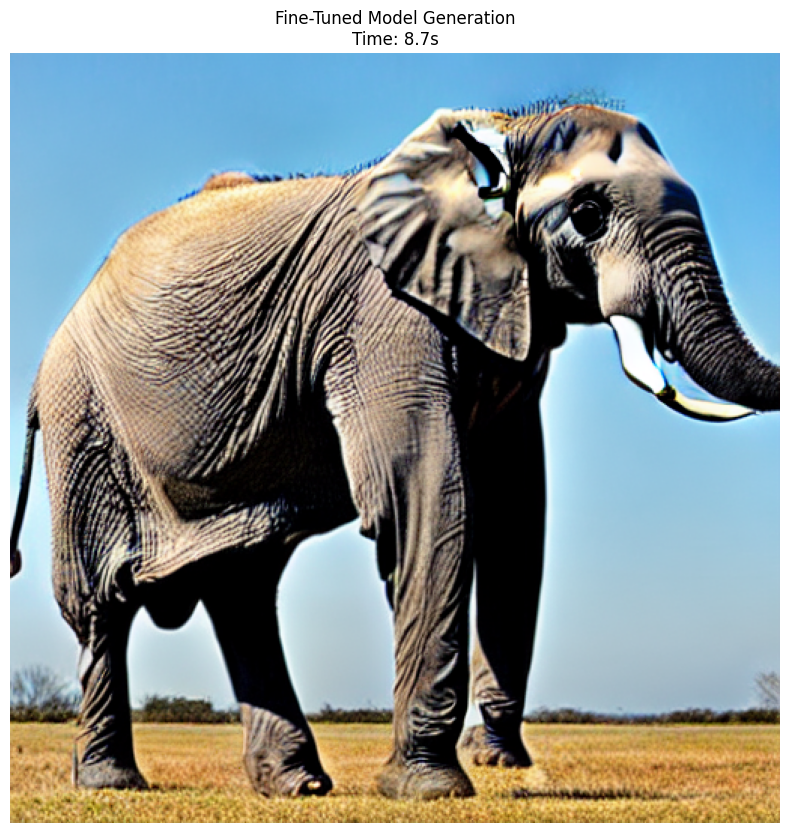

 Generated in 8.7 seconds

 Tip: This model is fine-tuned for a particular domain
Run this cell again to generate another image.


In [ ]:

print("\n" + "="*80)
print(" GENERATE WITH YOUR FINE-TUNED MODEL")
print("="*80)
print("Model specialized for particular domain")
print("-" * 80)

user_prompt = input("Enter your prompt: ")

if user_prompt.strip():
    print(f"\n Generating with fine-tuned model: {user_prompt}")
    print("   Please wait...")

    start_time = datetime.now()


    with torch.inference_mode():
        result = pipe(
            prompt=user_prompt,
            num_inference_steps=25,
            guidance_scale=7.5,
            height=512,
            width=512
        )

    gen_time = (datetime.now() - start_time).total_seconds()


    plt.figure(figsize=(10, 10))
    plt.imshow(result.images[0])
    plt.title(f"Fine-Tuned Model Generation\nTime: {gen_time:.1f}s", fontsize=12)
    plt.axis('off')
    plt.show()

    print(f" Generated in {gen_time:.1f} seconds")
    print("\n Tip: This model is fine-tuned for a particular domain")
    print("Run this cell again to generate another image.")
else:
    print(" No prompt entered. Please run the cell again.")

****Experiment with different CFGs and Schedulers and choosing the best model****

In [ ]:


import torch
import numpy as np
import os
from datetime import datetime
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt
from torchvision import models, transforms
from scipy import linalg
import json
from tqdm import tqdm

from diffusers import (
    StableDiffusionPipeline,
    DDIMScheduler,
    PNDMScheduler,
    DPMSolverMultistepScheduler,
    EulerDiscreteScheduler
)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

Using device: cuda


In [ ]:

MODEL_PATH = "models/fine_tuned_animals"


CFG_SCALES = [5.0, 7.5, 10]
SCHEDULERS = {
    "DDIM": DDIMScheduler,
    "PNDM": PNDMScheduler,
    "Euler": EulerDiscreteScheduler
}

CAT_PROMPT = "A photorealistic orange tabby cat sitting gracefully, highly detailed"
NUM_STEPS = 40
NUM_TEST_IMAGES = 40

print("\n" + "="*80)
print("CONFIGURATION READY")
print("="*80)
print(f"Schedulers to test: {list(SCHEDULERS.keys())}")
print(f"CFG scales to test: {CFG_SCALES}")
print(f"Steps: {NUM_STEPS}")
print(f"Images per config: {NUM_TEST_IMAGES}")


CONFIGURATION READY
Schedulers to test: ['DDIM', 'PNDM', 'Euler']
CFG scales to test: [5.0, 7.5, 10]
Steps: 40
Images per config: 40


In [ ]:

print("\nLoading fine-tuned model...")
pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_PATH,
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
    safety_checker=None,
    requires_safety_checker=False
).to(DEVICE)

if hasattr(pipe, "enable_attention_slicing"):
    pipe.enable_attention_slicing()

print(f" Model loaded from: {MODEL_PATH}")


Loading fine-tuned model...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

 Model loaded from: models/fine_tuned_animals


In [ ]:


print("Setting up InceptionV3 for proper metrics...")


inception_model = models.inception_v3(pretrained=True, transform_input=False)
inception_model.eval()
inception_model.to(DEVICE)


preprocess = transforms.Compose([
    transforms.Resize((299, 299), Image.BILINEAR),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


def get_inception_features(images):
    """Extract proper 2048-dim features from InceptionV3"""
    features = []


    inception_model.fc = torch.nn.Identity()

    with torch.no_grad():
        for img in images:
            img_tensor = preprocess(img).unsqueeze(0).to(DEVICE)
            feat = inception_model(img_tensor)
            features.append(feat.cpu().numpy())

    return np.vstack(features)


def calculate_proper_fid(features1, features2):
    """Calculate proper FID score using Fréchet distance"""

    mu1, sigma1 = np.mean(features1, axis=0), np.cov(features1, rowvar=False)
    mu2, sigma2 = np.mean(features2, axis=0), np.cov(features2, rowvar=False)


    diff = mu1 - mu2


    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)


    if np.iscomplexobj(covmean):
        covmean = covmean.real


    tr_covmean = np.trace(covmean)
    fid = diff.dot(diff) + np.trace(sigma1) + np.trace(sigma2) - 2 * tr_covmean

    return float(fid)

# INCEPTION SCORE (IS) CALCULATION
def calculate_proper_is(images, splits=5):
    """Calculate proper Inception Score"""

    inception_model.fc = torch.nn.Linear(2048, 1000).to(DEVICE)
    inception_model.eval()

    preds = []
    with torch.no_grad():
        for img in images:
            img_tensor = preprocess(img).unsqueeze(0).to(DEVICE)
            logits = inception_model(img_tensor)
            pred = torch.nn.functional.softmax(logits, dim=1)
            preds.append(pred.cpu().numpy())

    preds = np.vstack(preds)


    scores = []
    split_size = len(preds) // splits

    for i in range(splits):
        part = preds[i * split_size : (i + 1) * split_size]
        py = np.mean(part, axis=0)

        kl_scores = []
        for px in part:
            kl = np.sum(px * (np.log(px + 1e-10) - np.log(py + 1e-10)))
            kl_scores.append(kl)

        scores.append(np.exp(np.mean(kl_scores)))

    return float(np.mean(scores)), float(np.std(scores))

print(" Proper metrics functions ready")

Setting up InceptionV3 for proper metrics...


/opt/miniconda/envs/eai/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/miniconda/envs/eai/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


 Proper metrics functions ready


In [ ]:

print("\n" + "="*80)
print("GENERATING REFERENCE SET")
print("="*80)


reference_prompts = [
    "A fluffy white cat sitting elegantly",
    "A sleek black cat with yellow eyes",
    "A playful kitten with a toy",
    "A majestic cat with long fur",
    "A cute cat with striking blue eyes"
]

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

print("Generating reference images for FID baseline...")
reference_images = []

for i in tqdm(range(NUM_TEST_IMAGES), desc="Reference images"):
    prompt = reference_prompts[i % len(reference_prompts)]

    with torch.inference_mode():
        img = pipe(
            prompt=prompt,
            num_inference_steps=NUM_STEPS,
            guidance_scale=7.5,
            height=512,
            width=512,
            generator=torch.Generator(DEVICE).manual_seed(i * 100)
        ).images[0]

    reference_images.append(img)
print("Extracting reference features...")
reference_features = get_inception_features(reference_images)
print(f" Reference features shape: {reference_features.shape}")


GENERATING REFERENCE SET
Generating reference images for FID baseline...


Reference images:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:   2%|▎         | 1/40 [00:13<08:37, 13.27s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:   5%|▌         | 2/40 [00:26<08:22, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:   8%|▊         | 3/40 [00:39<08:08, 13.20s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  10%|█         | 4/40 [00:52<07:54, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  12%|█▎        | 5/40 [01:05<07:41, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  15%|█▌        | 6/40 [01:19<07:28, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  18%|█▊        | 7/40 [01:32<07:15, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  20%|██        | 8/40 [01:45<07:01, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  22%|██▎       | 9/40 [01:58<06:48, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  25%|██▌       | 10/40 [02:11<06:35, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  28%|██▊       | 11/40 [02:25<06:22, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  30%|███       | 12/40 [02:38<06:09, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  32%|███▎      | 13/40 [02:51<05:55, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  35%|███▌      | 14/40 [03:04<05:42, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  38%|███▊      | 15/40 [03:17<05:29, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  40%|████      | 16/40 [03:31<05:16, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  42%|████▎     | 17/40 [03:44<05:03, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  45%|████▌     | 18/40 [03:57<04:50, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  48%|████▊     | 19/40 [04:10<04:36, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  50%|█████     | 20/40 [04:23<04:23, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  52%|█████▎    | 21/40 [04:36<04:10, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  55%|█████▌    | 22/40 [04:50<03:57, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  57%|█████▊    | 23/40 [05:03<03:44, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  60%|██████    | 24/40 [05:16<03:30, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  62%|██████▎   | 25/40 [05:29<03:17, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  65%|██████▌   | 26/40 [05:42<03:04, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  68%|██████▊   | 27/40 [05:56<02:51, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  70%|███████   | 28/40 [06:09<02:38, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  72%|███████▎  | 29/40 [06:22<02:25, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  75%|███████▌  | 30/40 [06:35<02:11, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  78%|███████▊  | 31/40 [06:48<01:58, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  80%|████████  | 32/40 [07:01<01:45, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  82%|████████▎ | 33/40 [07:15<01:32, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  85%|████████▌ | 34/40 [07:28<01:19, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  88%|████████▊ | 35/40 [07:41<01:05, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  90%|█████████ | 36/40 [07:54<00:52, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  92%|█████████▎| 37/40 [08:07<00:39, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  95%|█████████▌| 38/40 [08:21<00:26, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images:  98%|█████████▊| 39/40 [08:34<00:13, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Reference images: 100%|██████████| 40/40 [08:47<00:00, 13.19s/it]


Extracting reference features...
 Reference features shape: (40, 2048)


In [ ]:

print("\n" + "="*80)
print("TESTING ALL CONFIGURATIONS")
print("="*80)

results = []
cat_images = {}

for scheduler_name, scheduler_class in SCHEDULERS.items():
    print(f"\n🔧 Scheduler: {scheduler_name}")
    pipe.scheduler = scheduler_class.from_config(pipe.scheduler.config)

    for cfg in CFG_SCALES:
        config_name = f"{scheduler_name}_cfg{cfg}"
        print(f"  Testing CFG={cfg}")


        generated_images = []
        generation_times = []

        for i in tqdm(range(NUM_TEST_IMAGES), desc=f"    Generating", leave=False):
            start = datetime.now()

            with torch.inference_mode():
                img = pipe(
                    prompt=CAT_PROMPT,  # SAME PROMPT FOR ALL
                    num_inference_steps=NUM_STEPS,
                    guidance_scale=cfg,
                    height=512,
                    width=512,
                    generator=torch.Generator(DEVICE).manual_seed(i)
                ).images[0]

            generation_times.append((datetime.now() - start).total_seconds())
            generated_images.append(img)


            if i == 0:
                cat_images[config_name] = img


        print("    Calculating metrics...")


        gen_features = get_inception_features(generated_images)
        fid = calculate_proper_fid(reference_features, gen_features)


        is_mean, is_std = calculate_proper_is(generated_images)

        avg_time = np.mean(generation_times)

        results.append({
            "scheduler": scheduler_name,
            "cfg": cfg,
            "fid": fid,
            "is": is_mean,
            "is_std": is_std,
            "time": avg_time
        })

        print(f"     FID: {fid:.2f} | IS: {is_mean:.2f}±{is_std:.2f} | Time: {avg_time:.2f}s")


        if torch.cuda.is_available():
            torch.cuda.empty_cache()

print("\n All configurations tested!")



TESTING ALL CONFIGURATIONS

🔧 Scheduler: DDIM
  Testing CFG=5.0


    Generating:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   2%|▎         | 1/40 [00:13<08:37, 13.28s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   5%|▌         | 2/40 [00:26<08:23, 13.24s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   8%|▊         | 3/40 [00:39<08:09, 13.23s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  10%|█         | 4/40 [00:52<07:56, 13.23s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  12%|█▎        | 5/40 [01:06<07:42, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  15%|█▌        | 6/40 [01:19<07:29, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  18%|█▊        | 7/40 [01:32<07:16, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  20%|██        | 8/40 [01:45<07:03, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  22%|██▎       | 9/40 [01:59<06:49, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  25%|██▌       | 10/40 [02:12<06:36, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  28%|██▊       | 11/40 [02:25<06:23, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  30%|███       | 12/40 [02:38<06:10, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  32%|███▎      | 13/40 [02:51<05:56, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  35%|███▌      | 14/40 [03:05<05:43, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  38%|███▊      | 15/40 [03:18<05:30, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  40%|████      | 16/40 [03:31<05:17, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  42%|████▎     | 17/40 [03:44<05:04, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  45%|████▌     | 18/40 [03:57<04:50, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  48%|████▊     | 19/40 [04:11<04:37, 13.21s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  50%|█████     | 20/40 [04:24<04:24, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  52%|█████▎    | 21/40 [04:37<04:11, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  55%|█████▌    | 22/40 [04:50<03:57, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  57%|█████▊    | 23/40 [05:04<03:44, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  60%|██████    | 24/40 [05:17<03:31, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  62%|██████▎   | 25/40 [05:30<03:18, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  65%|██████▌   | 26/40 [05:43<03:05, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  68%|██████▊   | 27/40 [05:56<02:51, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  70%|███████   | 28/40 [06:10<02:38, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  72%|███████▎  | 29/40 [06:23<02:25, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  75%|███████▌  | 30/40 [06:36<02:12, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  78%|███████▊  | 31/40 [06:49<01:58, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  80%|████████  | 32/40 [07:03<01:45, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  82%|████████▎ | 33/40 [07:16<01:32, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  85%|████████▌ | 34/40 [07:29<01:19, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  88%|████████▊ | 35/40 [07:42<01:06, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  90%|█████████ | 36/40 [07:55<00:52, 13.21s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  92%|█████████▎| 37/40 [08:09<00:39, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  95%|█████████▌| 38/40 [08:22<00:26, 13.21s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  98%|█████████▊| 39/40 [08:35<00:13, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Calculating metrics...
     FID: 161.85 | IS: 1.00±0.00 | Time: 13.22s
  Testing CFG=7.5


    Generating:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   2%|▎         | 1/40 [00:13<08:36, 13.25s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   5%|▌         | 2/40 [00:26<08:22, 13.23s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   8%|▊         | 3/40 [00:39<08:09, 13.23s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  10%|█         | 4/40 [00:52<07:56, 13.23s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  12%|█▎        | 5/40 [01:06<07:42, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  15%|█▌        | 6/40 [01:19<07:29, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  18%|█▊        | 7/40 [01:32<07:16, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  20%|██        | 8/40 [01:45<07:03, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  22%|██▎       | 9/40 [01:59<06:49, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  25%|██▌       | 10/40 [02:12<06:36, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  28%|██▊       | 11/40 [02:25<06:23, 13.23s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  30%|███       | 12/40 [02:38<06:10, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  32%|███▎      | 13/40 [02:51<05:56, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  35%|███▌      | 14/40 [03:05<05:43, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  38%|███▊      | 15/40 [03:18<05:30, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  40%|████      | 16/40 [03:31<05:17, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  42%|████▎     | 17/40 [03:44<05:04, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  45%|████▌     | 18/40 [03:58<04:50, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  48%|████▊     | 19/40 [04:11<04:37, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  50%|█████     | 20/40 [04:24<04:24, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  52%|█████▎    | 21/40 [04:37<04:11, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  55%|█████▌    | 22/40 [04:50<03:57, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  57%|█████▊    | 23/40 [05:04<03:44, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  60%|██████    | 24/40 [05:17<03:31, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  62%|██████▎   | 25/40 [05:30<03:18, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  65%|██████▌   | 26/40 [05:43<03:05, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  68%|██████▊   | 27/40 [05:57<02:51, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  70%|███████   | 28/40 [06:10<02:38, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  72%|███████▎  | 29/40 [06:23<02:25, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  75%|███████▌  | 30/40 [06:36<02:12, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  78%|███████▊  | 31/40 [06:49<01:58, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  80%|████████  | 32/40 [07:03<01:45, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  82%|████████▎ | 33/40 [07:16<01:32, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  85%|████████▌ | 34/40 [07:29<01:19, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  88%|████████▊ | 35/40 [07:42<01:06, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  90%|█████████ | 36/40 [07:55<00:52, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  92%|█████████▎| 37/40 [08:09<00:39, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  95%|█████████▌| 38/40 [08:22<00:26, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  98%|█████████▊| 39/40 [08:35<00:13, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Calculating metrics...
     FID: 156.92 | IS: 1.00±0.00 | Time: 13.22s
  Testing CFG=10


    Generating:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   2%|▎         | 1/40 [00:13<08:36, 13.24s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   5%|▌         | 2/40 [00:26<08:22, 13.23s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   8%|▊         | 3/40 [00:39<08:09, 13.23s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  10%|█         | 4/40 [00:52<07:56, 13.23s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  12%|█▎        | 5/40 [01:06<07:42, 13.23s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  15%|█▌        | 6/40 [01:19<07:29, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  18%|█▊        | 7/40 [01:32<07:16, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  20%|██        | 8/40 [01:45<07:03, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  22%|██▎       | 9/40 [01:59<06:49, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  25%|██▌       | 10/40 [02:12<06:36, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  28%|██▊       | 11/40 [02:25<06:23, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  30%|███       | 12/40 [02:38<06:10, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  32%|███▎      | 13/40 [02:51<05:56, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  35%|███▌      | 14/40 [03:05<05:43, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  38%|███▊      | 15/40 [03:18<05:30, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  40%|████      | 16/40 [03:31<05:17, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  42%|████▎     | 17/40 [03:44<05:04, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  45%|████▌     | 18/40 [03:57<04:50, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  48%|████▊     | 19/40 [04:11<04:37, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  50%|█████     | 20/40 [04:24<04:24, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  52%|█████▎    | 21/40 [04:37<04:11, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  55%|█████▌    | 22/40 [04:50<03:57, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  57%|█████▊    | 23/40 [05:04<03:44, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  60%|██████    | 24/40 [05:17<03:31, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  62%|██████▎   | 25/40 [05:30<03:18, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  65%|██████▌   | 26/40 [05:43<03:05, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  68%|██████▊   | 27/40 [05:56<02:51, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  70%|███████   | 28/40 [06:10<02:38, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  72%|███████▎  | 29/40 [06:23<02:25, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  75%|███████▌  | 30/40 [06:36<02:12, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  78%|███████▊  | 31/40 [06:49<01:58, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  80%|████████  | 32/40 [07:03<01:45, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  82%|████████▎ | 33/40 [07:16<01:32, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  85%|████████▌ | 34/40 [07:29<01:19, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  88%|████████▊ | 35/40 [07:42<01:06, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  90%|█████████ | 36/40 [07:55<00:52, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  92%|█████████▎| 37/40 [08:09<00:39, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  95%|█████████▌| 38/40 [08:22<00:26, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  98%|█████████▊| 39/40 [08:35<00:13, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Calculating metrics...
     FID: 155.29 | IS: 1.00±0.00 | Time: 13.22s

🔧 Scheduler: PNDM
  Testing CFG=5.0


    Generating:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   2%|▎         | 1/40 [00:13<08:48, 13.56s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   5%|▌         | 2/40 [00:27<08:34, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   8%|▊         | 3/40 [00:40<08:20, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  10%|█         | 4/40 [00:54<08:07, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  12%|█▎        | 5/40 [01:07<07:53, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  15%|█▌        | 6/40 [01:21<07:40, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  18%|█▊        | 7/40 [01:34<07:26, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  20%|██        | 8/40 [01:48<07:13, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  22%|██▎       | 9/40 [02:01<06:59, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  25%|██▌       | 10/40 [02:15<06:46, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  28%|██▊       | 11/40 [02:28<06:32, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  30%|███       | 12/40 [02:42<06:19, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  32%|███▎      | 13/40 [02:56<06:05, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  35%|███▌      | 14/40 [03:09<05:52, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  38%|███▊      | 15/40 [03:23<05:38, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  40%|████      | 16/40 [03:36<05:24, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  42%|████▎     | 17/40 [03:50<05:11, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  45%|████▌     | 18/40 [04:03<04:57, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  48%|████▊     | 19/40 [04:17<04:44, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  50%|█████     | 20/40 [04:30<04:30, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  52%|█████▎    | 21/40 [04:44<04:17, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  55%|█████▌    | 22/40 [04:57<04:03, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  57%|█████▊    | 23/40 [05:11<03:50, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  60%|██████    | 24/40 [05:24<03:36, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  62%|██████▎   | 25/40 [05:38<03:22, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  65%|██████▌   | 26/40 [05:51<03:09, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  68%|██████▊   | 27/40 [06:05<02:55, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  70%|███████   | 28/40 [06:18<02:42, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  72%|███████▎  | 29/40 [06:32<02:28, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  75%|███████▌  | 30/40 [06:46<02:15, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  78%|███████▊  | 31/40 [06:59<02:01, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  80%|████████  | 32/40 [07:13<01:48, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  82%|████████▎ | 33/40 [07:26<01:34, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  85%|████████▌ | 34/40 [07:40<01:21, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  88%|████████▊ | 35/40 [07:53<01:07, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  90%|█████████ | 36/40 [08:07<00:54, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  92%|█████████▎| 37/40 [08:20<00:40, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  95%|█████████▌| 38/40 [08:34<00:27, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  98%|█████████▊| 39/40 [08:47<00:13, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Calculating metrics...
     FID: 159.08 | IS: 1.00±0.00 | Time: 13.53s
  Testing CFG=7.5


    Generating:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   2%|▎         | 1/40 [00:13<08:49, 13.57s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   5%|▌         | 2/40 [00:27<08:34, 13.55s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   8%|▊         | 3/40 [00:40<08:21, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  10%|█         | 4/40 [00:54<08:07, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  12%|█▎        | 5/40 [01:07<07:53, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  15%|█▌        | 6/40 [01:21<07:40, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  18%|█▊        | 7/40 [01:34<07:26, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  20%|██        | 8/40 [01:48<07:13, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  22%|██▎       | 9/40 [02:01<06:59, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  25%|██▌       | 10/40 [02:15<06:46, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  28%|██▊       | 11/40 [02:28<06:32, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  30%|███       | 12/40 [02:42<06:19, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  32%|███▎      | 13/40 [02:56<06:05, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  35%|███▌      | 14/40 [03:09<05:51, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  38%|███▊      | 15/40 [03:23<05:38, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  40%|████      | 16/40 [03:36<05:24, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  42%|████▎     | 17/40 [03:50<05:11, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  45%|████▌     | 18/40 [04:03<04:57, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  48%|████▊     | 19/40 [04:17<04:44, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  50%|█████     | 20/40 [04:30<04:30, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  52%|█████▎    | 21/40 [04:44<04:17, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  55%|█████▌    | 22/40 [04:57<04:03, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  57%|█████▊    | 23/40 [05:11<03:50, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  60%|██████    | 24/40 [05:24<03:36, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  62%|██████▎   | 25/40 [05:38<03:23, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  65%|██████▌   | 26/40 [05:52<03:09, 13.55s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  68%|██████▊   | 27/40 [06:05<02:56, 13.55s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  70%|███████   | 28/40 [06:19<02:42, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  72%|███████▎  | 29/40 [06:32<02:28, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  75%|███████▌  | 30/40 [06:46<02:15, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  78%|███████▊  | 31/40 [06:59<02:01, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  80%|████████  | 32/40 [07:13<01:48, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  82%|████████▎ | 33/40 [07:26<01:34, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  85%|████████▌ | 34/40 [07:40<01:21, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  88%|████████▊ | 35/40 [07:53<01:07, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  90%|█████████ | 36/40 [08:07<00:54, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  92%|█████████▎| 37/40 [08:20<00:40, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  95%|█████████▌| 38/40 [08:34<00:27, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  98%|█████████▊| 39/40 [08:47<00:13, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Calculating metrics...
     FID: 157.52 | IS: 1.00±0.00 | Time: 13.54s
  Testing CFG=10


    Generating:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   2%|▎         | 1/40 [00:13<08:49, 13.57s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   5%|▌         | 2/40 [00:27<08:35, 13.55s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   8%|▊         | 3/40 [00:40<08:21, 13.55s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  10%|█         | 4/40 [00:54<08:07, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  12%|█▎        | 5/40 [01:07<07:53, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  15%|█▌        | 6/40 [01:21<07:40, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  18%|█▊        | 7/40 [01:34<07:26, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  20%|██        | 8/40 [01:48<07:13, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  22%|██▎       | 9/40 [02:01<06:59, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  25%|██▌       | 10/40 [02:15<06:46, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  28%|██▊       | 11/40 [02:28<06:32, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  30%|███       | 12/40 [02:42<06:19, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  32%|███▎      | 13/40 [02:56<06:05, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  35%|███▌      | 14/40 [03:09<05:52, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  38%|███▊      | 15/40 [03:23<05:38, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  40%|████      | 16/40 [03:36<05:24, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  42%|████▎     | 17/40 [03:50<05:11, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  45%|████▌     | 18/40 [04:03<04:57, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  48%|████▊     | 19/40 [04:17<04:44, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  50%|█████     | 20/40 [04:30<04:30, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  52%|█████▎    | 21/40 [04:44<04:17, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  55%|█████▌    | 22/40 [04:57<04:03, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  57%|█████▊    | 23/40 [05:11<03:50, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  60%|██████    | 24/40 [05:24<03:36, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  62%|██████▎   | 25/40 [05:38<03:22, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  65%|██████▌   | 26/40 [05:51<03:09, 13.53s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  68%|██████▊   | 27/40 [06:05<02:55, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  70%|███████   | 28/40 [06:19<02:42, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  72%|███████▎  | 29/40 [06:32<02:28, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  75%|███████▌  | 30/40 [06:46<02:15, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  78%|███████▊  | 31/40 [06:59<02:01, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  80%|████████  | 32/40 [07:13<01:48, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  82%|████████▎ | 33/40 [07:26<01:34, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  85%|████████▌ | 34/40 [07:40<01:21, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  88%|████████▊ | 35/40 [07:53<01:07, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  90%|█████████ | 36/40 [08:07<00:54, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  92%|█████████▎| 37/40 [08:20<00:40, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  95%|█████████▌| 38/40 [08:34<00:27, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  98%|█████████▊| 39/40 [08:47<00:13, 13.54s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Calculating metrics...
     FID: 156.69 | IS: 1.00±0.00 | Time: 13.54s

🔧 Scheduler: Euler
  Testing CFG=5.0


    Generating:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   2%|▎         | 1/40 [00:13<08:35, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   5%|▌         | 2/40 [00:26<08:21, 13.20s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   8%|▊         | 3/40 [00:39<08:08, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  10%|█         | 4/40 [00:52<07:54, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  12%|█▎        | 5/40 [01:05<07:41, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  15%|█▌        | 6/40 [01:19<07:28, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  18%|█▊        | 7/40 [01:32<07:15, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  20%|██        | 8/40 [01:45<07:01, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  22%|██▎       | 9/40 [01:58<06:48, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  25%|██▌       | 10/40 [02:11<06:35, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  28%|██▊       | 11/40 [02:25<06:22, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  30%|███       | 12/40 [02:38<06:09, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  32%|███▎      | 13/40 [02:51<05:56, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  35%|███▌      | 14/40 [03:04<05:42, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  38%|███▊      | 15/40 [03:17<05:29, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  40%|████      | 16/40 [03:30<05:16, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  42%|████▎     | 17/40 [03:44<05:03, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  45%|████▌     | 18/40 [03:57<04:50, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  48%|████▊     | 19/40 [04:10<04:36, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  50%|█████     | 20/40 [04:23<04:23, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  52%|█████▎    | 21/40 [04:36<04:10, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  55%|█████▌    | 22/40 [04:50<03:57, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  57%|█████▊    | 23/40 [05:03<03:44, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  60%|██████    | 24/40 [05:16<03:30, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  62%|██████▎   | 25/40 [05:29<03:17, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  65%|██████▌   | 26/40 [05:42<03:04, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  68%|██████▊   | 27/40 [05:56<02:51, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  70%|███████   | 28/40 [06:09<02:38, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  72%|███████▎  | 29/40 [06:22<02:25, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  75%|███████▌  | 30/40 [06:35<02:11, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  78%|███████▊  | 31/40 [06:48<01:58, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  80%|████████  | 32/40 [07:01<01:45, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  82%|████████▎ | 33/40 [07:15<01:32, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  85%|████████▌ | 34/40 [07:28<01:19, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  88%|████████▊ | 35/40 [07:41<01:05, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  90%|█████████ | 36/40 [07:54<00:52, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  92%|█████████▎| 37/40 [08:07<00:39, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  95%|█████████▌| 38/40 [08:21<00:26, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  98%|█████████▊| 39/40 [08:34<00:13, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Calculating metrics...
     FID: 160.36 | IS: 1.00±0.00 | Time: 13.18s
  Testing CFG=7.5


    Generating:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   2%|▎         | 1/40 [00:13<08:35, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   5%|▌         | 2/40 [00:26<08:21, 13.20s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   8%|▊         | 3/40 [00:39<08:08, 13.20s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  10%|█         | 4/40 [00:52<07:54, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  12%|█▎        | 5/40 [01:05<07:41, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  15%|█▌        | 6/40 [01:19<07:28, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  18%|█▊        | 7/40 [01:32<07:14, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  20%|██        | 8/40 [01:45<07:01, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  22%|██▎       | 9/40 [01:58<06:48, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  25%|██▌       | 10/40 [02:11<06:35, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  28%|██▊       | 11/40 [02:25<06:22, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  30%|███       | 12/40 [02:38<06:09, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  32%|███▎      | 13/40 [02:51<05:55, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  35%|███▌      | 14/40 [03:04<05:42, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  38%|███▊      | 15/40 [03:17<05:29, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  40%|████      | 16/40 [03:30<05:16, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  42%|████▎     | 17/40 [03:44<05:03, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  45%|████▌     | 18/40 [03:57<04:50, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  48%|████▊     | 19/40 [04:10<04:36, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  50%|█████     | 20/40 [04:23<04:23, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  52%|█████▎    | 21/40 [04:36<04:10, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  55%|█████▌    | 22/40 [04:50<03:57, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  57%|█████▊    | 23/40 [05:03<03:44, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  60%|██████    | 24/40 [05:16<03:31, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  62%|██████▎   | 25/40 [05:29<03:17, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  65%|██████▌   | 26/40 [05:42<03:04, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  68%|██████▊   | 27/40 [05:56<02:51, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  70%|███████   | 28/40 [06:09<02:38, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  72%|███████▎  | 29/40 [06:22<02:25, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  75%|███████▌  | 30/40 [06:35<02:11, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  78%|███████▊  | 31/40 [06:48<01:58, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  80%|████████  | 32/40 [07:02<01:45, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  82%|████████▎ | 33/40 [07:15<01:32, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  85%|████████▌ | 34/40 [07:28<01:19, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  88%|████████▊ | 35/40 [07:41<01:05, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  90%|█████████ | 36/40 [07:54<00:52, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  92%|█████████▎| 37/40 [08:07<00:39, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  95%|█████████▌| 38/40 [08:21<00:26, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  98%|█████████▊| 39/40 [08:34<00:13, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Calculating metrics...
     FID: 156.65 | IS: 1.00±0.00 | Time: 13.19s
  Testing CFG=10


    Generating:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   2%|▎         | 1/40 [00:13<08:35, 13.22s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   5%|▌         | 2/40 [00:26<08:21, 13.20s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:   8%|▊         | 3/40 [00:39<08:08, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  10%|█         | 4/40 [00:52<07:54, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  12%|█▎        | 5/40 [01:05<07:41, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  15%|█▌        | 6/40 [01:19<07:28, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  18%|█▊        | 7/40 [01:32<07:15, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  20%|██        | 8/40 [01:45<07:01, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  22%|██▎       | 9/40 [01:58<06:48, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  25%|██▌       | 10/40 [02:11<06:35, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  28%|██▊       | 11/40 [02:25<06:22, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  30%|███       | 12/40 [02:38<06:09, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  32%|███▎      | 13/40 [02:51<05:55, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  35%|███▌      | 14/40 [03:04<05:42, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  38%|███▊      | 15/40 [03:17<05:29, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  40%|████      | 16/40 [03:30<05:16, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  42%|████▎     | 17/40 [03:44<05:03, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  45%|████▌     | 18/40 [03:57<04:50, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  48%|████▊     | 19/40 [04:10<04:36, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  50%|█████     | 20/40 [04:23<04:23, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  52%|█████▎    | 21/40 [04:36<04:10, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  55%|█████▌    | 22/40 [04:50<03:57, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  57%|█████▊    | 23/40 [05:03<03:44, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  60%|██████    | 24/40 [05:16<03:30, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  62%|██████▎   | 25/40 [05:29<03:17, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  65%|██████▌   | 26/40 [05:42<03:04, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  68%|██████▊   | 27/40 [05:55<02:51, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  70%|███████   | 28/40 [06:09<02:38, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  72%|███████▎  | 29/40 [06:22<02:25, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  75%|███████▌  | 30/40 [06:35<02:11, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  78%|███████▊  | 31/40 [06:48<01:58, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  80%|████████  | 32/40 [07:01<01:45, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  82%|████████▎ | 33/40 [07:15<01:32, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  85%|████████▌ | 34/40 [07:28<01:19, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  88%|████████▊ | 35/40 [07:41<01:05, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  90%|█████████ | 36/40 [07:54<00:52, 13.19s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  92%|█████████▎| 37/40 [08:07<00:39, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  95%|█████████▌| 38/40 [08:21<00:26, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Generating:  98%|█████████▊| 39/40 [08:34<00:13, 13.18s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

    Calculating metrics...
     FID: 153.80 | IS: 1.00±0.00 | Time: 13.18s

 All configurations tested!


In [ ]:


df_results = pd.DataFrame(results)

print("\n" + "="*80)
print(" TABLE RESULTS SUMMARY")
print("="*80)
print(df_results[['scheduler', 'cfg', 'fid', 'is', 'time']].to_string(index=False))

best_by_is = df_results.iloc[df_results['is'].idxmax()]
best_by_fid = df_results.iloc[df_results['fid'].idxmin()]  

print("\n" + "="*80)
print("BEST CONFIGURATIONS")
print("="*80)
print(f" Best by Inception Score (higher is better):")
print(f"   {best_by_is['scheduler']} with CFG={best_by_is['cfg']}")
print(f"   FID: {best_by_is['fid']:.2f} | IS: {best_by_is['is']:.2f}±{best_by_is['is_std']:.2f}")

print(f"\n Best by FID Score (lower is better):")
print(f"   {best_by_fid['scheduler']} with CFG={best_by_fid['cfg']}")
print(f"   FID: {best_by_fid['fid']:.2f} | IS: {best_by_fid['is']:.2f}±{best_by_fid['is_std']:.2f}")

fid_normalized = (df_results['fid'].max() - df_results['fid']) / (df_results['fid'].max() - df_results['fid'].min())
is_normalized = (df_results['is'] - df_results['is'].min()) / (df_results['is'].max() - df_results['is'].min())
df_results['combined_score'] = 0.5 * fid_normalized + 0.5 * is_normalized

best_overall = df_results.iloc[df_results['combined_score'].idxmax()]

print(f"\n BEST OVERALL (combined metrics):")
print(f"   {best_overall['scheduler']} with CFG={best_overall['cfg']}")
print(f"   FID: {best_overall['fid']:.2f} | IS: {best_overall['is']:.2f}±{best_overall['is_std']:.2f}")


 TABLE RESULTS SUMMARY
scheduler  cfg        fid       is      time
     DDIM  5.0 161.852751 1.004309 13.217873
     DDIM  7.5 156.924592 1.003790 13.220549
     DDIM 10.0 155.292840 1.004356 13.220120
     PNDM  5.0 159.080469 1.004004 13.534022
     PNDM  7.5 157.519602 1.003923 13.537324
     PNDM 10.0 156.692247 1.004386 13.537244
    Euler  5.0 160.363504 1.004453 13.183472
    Euler  7.5 156.654918 1.003968 13.187772
    Euler 10.0 153.804521 1.004551 13.183246

BEST CONFIGURATIONS
 Best by Inception Score (higher is better):
   Euler with CFG=10.0
   FID: 153.80 | IS: 1.00±0.00

 Best by FID Score (lower is better):
   Euler with CFG=10.0
   FID: 153.80 | IS: 1.00±0.00

 BEST OVERALL (combined metrics):
   Euler with CFG=10.0
   FID: 153.80 | IS: 1.00±0.00


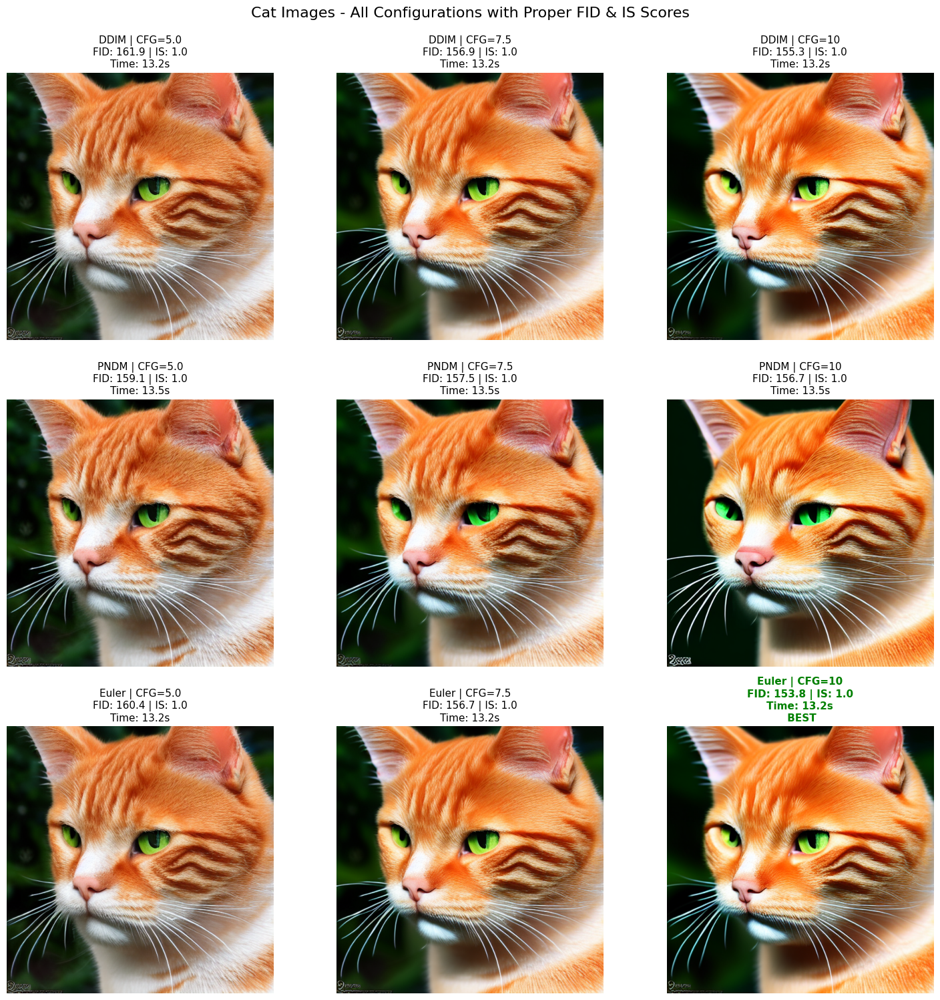

 Comparison grid saved as 'comparison_proper_metrics.png'


In [ ]:

n_schedulers = len(SCHEDULERS)
n_cfgs = len(CFG_SCALES)

fig, axes = plt.subplots(n_schedulers, n_cfgs, figsize=(n_cfgs * 5, n_schedulers * 5))
fig.suptitle('Cat Images - All Configurations with Proper FID & IS Scores', fontsize=16, y=0.995)


if n_schedulers == 1:
    axes = axes.reshape(1, -1)
if n_cfgs == 1:
    axes = axes.reshape(-1, 1)

scheduler_list = list(SCHEDULERS.keys())

for idx in range(n_schedulers):
    for jdx in range(n_cfgs):
        ax = axes[idx, jdx]
        scheduler_name = scheduler_list[idx]
        cfg = CFG_SCALES[jdx]
        config_name = f"{scheduler_name}_cfg{cfg}"

        if config_name in cat_images:
            ax.imshow(cat_images[config_name])


            row = df_results[(df_results['scheduler'] == scheduler_name) &
                           (df_results['cfg'] == cfg)].iloc[0]


            is_best = (row['scheduler'] == best_overall['scheduler'] and
                      row['cfg'] == best_overall['cfg'])


            title_color = 'green' if is_best else 'black'
            weight = 'bold' if is_best else 'normal'

            title = f"{scheduler_name} | CFG={cfg}\n"
            title += f"FID: {row['fid']:.1f} | IS: {row['is']:.1f}\n"
            title += f"Time: {row['time']:.1f}s"

            if is_best:
                title += "\n BEST"

            ax.set_title(title, fontsize=11, color=title_color, weight=weight)

        ax.axis('off')

plt.tight_layout()
plt.savefig("comparison_proper_metrics.png", dpi=150, bbox_inches='tight')
plt.show()

print(" Comparison grid saved as 'comparison_proper_metrics.png'")


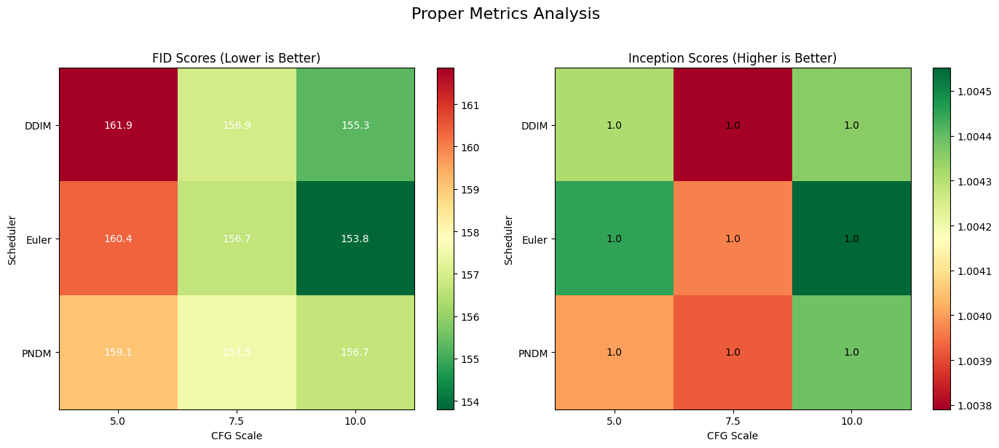

 Metrics analysis saved as 'metrics_analysis_proper.png'


In [ ]:

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

ax1 = axes[0]
df_pivot_fid = df_results.pivot(index='scheduler', columns='cfg', values='fid')
im1 = ax1.imshow(df_pivot_fid.values, cmap='RdYlGn_r', aspect='auto')
ax1.set_xticks(range(len(df_pivot_fid.columns)))
ax1.set_xticklabels(df_pivot_fid.columns)
ax1.set_yticks(range(len(df_pivot_fid.index)))
ax1.set_yticklabels(df_pivot_fid.index)
ax1.set_xlabel('CFG Scale')
ax1.set_ylabel('Scheduler')
ax1.set_title('FID Scores (Lower is Better)')
plt.colorbar(im1, ax=ax1)


for i in range(len(df_pivot_fid.index)):
    for j in range(len(df_pivot_fid.columns)):
        text = ax1.text(j, i, f'{df_pivot_fid.values[i, j]:.1f}',
                       ha="center", va="center", color="white", fontsize=10)


ax2 = axes[1]
df_pivot_is = df_results.pivot(index='scheduler', columns='cfg', values='is')
im2 = ax2.imshow(df_pivot_is.values, cmap='RdYlGn', aspect='auto')
ax2.set_xticks(range(len(df_pivot_is.columns)))
ax2.set_xticklabels(df_pivot_is.columns)
ax2.set_yticks(range(len(df_pivot_is.index)))
ax2.set_yticklabels(df_pivot_is.index)
ax2.set_xlabel('CFG Scale')
ax2.set_ylabel('Scheduler')
ax2.set_title('Inception Scores (Higher is Better)')
plt.colorbar(im2, ax=ax2)


for i in range(len(df_pivot_is.index)):
    for j in range(len(df_pivot_is.columns)):
        text = ax2.text(j, i, f'{df_pivot_is.values[i, j]:.1f}',
                       ha="center", va="center", color="black", fontsize=10)

plt.suptitle('Proper Metrics Analysis', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig("metrics_analysis_proper.png", dpi=150, bbox_inches='tight')
plt.show()

print(" Metrics analysis saved as 'metrics_analysis_proper.png'")

In [ ]:


print("\n" + "="*80)
print("SAVING BEST MODEL")
print("="*80)


best_scheduler_name = best_overall['scheduler']
best_cfg = best_overall['cfg']
best_scheduler_class = SCHEDULERS[best_scheduler_name]

print(f"Setting best configuration: {best_scheduler_name} with CFG={best_cfg}")
pipe.scheduler = best_scheduler_class.from_config(pipe.scheduler.config)


save_path = "models/best_evaluated_model"
os.makedirs(save_path, exist_ok=True)

pipe.save_pretrained(save_path)
print(f" Model saved to: {save_path}")
config_info = {
    "best_scheduler": best_scheduler_name,
    "best_cfg": float(best_cfg),
    "num_steps": NUM_STEPS,
    "fid_score": float(best_overall['fid']),
    "inception_score": float(best_overall['is']),
    "inception_score_std": float(best_overall['is_std']),
    "generation_time": float(best_overall['time']),
    "evaluation_date": datetime.now().isoformat(),
    "all_results": df_results[['scheduler', 'cfg', 'fid', 'is', 'time']].to_dict('records')
}

with open(f"{save_path}/best_config.json", "w") as f:
    json.dump(config_info, f, indent=2)

print(f" Configuration saved to: {save_path}/best_config.json")
print(f"\n Best model: {best_scheduler_name} with CFG={best_cfg}")
print(f"   FID: {best_overall['fid']:.2f} | IS: {best_overall['is']:.2f}±{best_overall['is_std']:.2f}")


SAVING BEST MODEL
Setting best configuration: Euler with CFG=10.0
 Model saved to: models/best_evaluated_model
 Configuration saved to: models/best_evaluated_model/best_config.json

 Best model: Euler with CFG=10.0
   FID: 153.80 | IS: 1.00±0.00


Thus optimized final samples are generated


 GENERATE WITH BEST CONFIGURATION
Best Config: Euler with CFG=10.0
FID: 153.80 | IS: 1.00±0.00

Enter your prompt below:


Your prompt:  wolf



📸 Generating: wolf


  0%|          | 0/40 [00:00<?, ?it/s]

 Image saved as: my_custom_generation.png


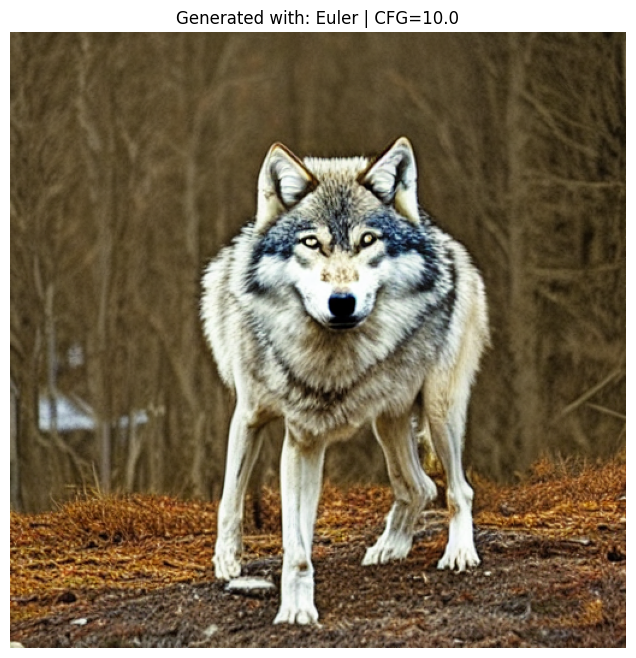


Run this cell again to generate another image!


In [ ]:

print("\n" + "="*80)
print(" GENERATE WITH BEST CONFIGURATION")
print("="*80)
print(f"Best Config: {best_overall['scheduler']} with CFG={best_overall['cfg']}")
print(f"FID: {best_overall['fid']:.2f} | IS: {best_overall['is']:.2f}±{best_overall['is_std']:.2f}")
print("="*80)

print("\nEnter your prompt below:")
MY_PROMPT = input("Your prompt: ")

if MY_PROMPT.strip():
    print(f"\n📸 Generating: {MY_PROMPT}")


    with torch.inference_mode():
        generated_image = pipe(
            prompt=MY_PROMPT,
            num_inference_steps=NUM_STEPS,
            guidance_scale=best_cfg,
            height=512,
            width=512,
            generator=torch.Generator(DEVICE).manual_seed(42)
        ).images[0]


    filename = "my_custom_generation.png"
    generated_image.save(filename)
    print(f" Image saved as: {filename}")


    plt.figure(figsize=(8, 8))
    plt.imshow(generated_image)
    plt.title(f"Generated with: {best_overall['scheduler']} | CFG={best_overall['cfg']}")
    plt.axis('off')
    plt.show()

    print("\n" + "="*60)
    print("Run this cell again to generate another image!")
else:
    print("No prompt entered. Please run the cell again and enter a prompt.")


In [ ]:
import zipfile
import os

def zip_directory(folder_path, zip_path):
    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                file_path = os.path.join(root, file)
                arcname = os.path.relpath(file_path, os.path.dirname(folder_path))
                zipf.write(file_path, arcname)
                print(f"Added: {arcname}")


zip_directory('models/best_evaluated_model', 'model_to_download.zip')
print("Created model_to_download.zip with all contents")

Added: best_evaluated_model/best_config.json
Added: best_evaluated_model/model_index.json
Added: best_evaluated_model/feature_extractor/preprocessor_config.json
Added: best_evaluated_model/scheduler/scheduler_config.json
Added: best_evaluated_model/text_encoder/config.json
Added: best_evaluated_model/text_encoder/model.safetensors
Added: best_evaluated_model/tokenizer/merges.txt
Added: best_evaluated_model/tokenizer/special_tokens_map.json
Added: best_evaluated_model/tokenizer/tokenizer_config.json
Added: best_evaluated_model/tokenizer/vocab.json
Added: best_evaluated_model/unet/config.json
